In [1]:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_digits.html#sphx-glr-auto-examples-cluster-plot-kmeans-digits-py
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler 
import plotly.express as px
import numpy as np
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()  # for plot styling
import json

file = 'Datasets/PAM194_Keratino_CytoPanel_1/pam194ObjPerinucCyto.csv'
features = pd.read_json('features.json')
df = pd.read_csv(file)

In [2]:
def drop_columns(data):
    data.drop(list(data.filter(regex = 'FileName_')), axis=1, inplace=True) # Dropping all of the columns starting with 'FileName_'
    data.drop(list(data.filter(regex = 'PathName_')), axis=1, inplace=True) # Dropping all of the columns starting with 'PathName_'
    data.drop(['Metadata_Date', 'Metadata_FileLocation', 'Metadata_Frame',
              'Metadata_Run', 'Metadata_Series'], axis=1, inplace=True)
    
drop_columns(df)

In [3]:

def replace_NA(data):
    measurements = data.iloc[:,6:].columns # since we know which columns we're dropping, should this subset be fixed?
    for measure in measurements:
        if data[measure].isna().any():
            data[measure].fillna(data[measure].mean(), inplace=True)
            
replace_NA(df)
df.shape

(90775, 102)

In [4]:
meta_features = ['Metadata_Metadata_Cytokine','Metadata_Plate', 'Metadata_Well', 'Metadata_Metadata_Dose', 'ImageNumber']
df = df.drop(columns=['ObjectNumber'])
# meta_df = df[meta_features]
# df = df.drop(columns=meta_features)
# df.shape

In [5]:
map_plate = {j[1]:j[0] for j in enumerate(df['Metadata_Plate'].unique())}
df['Metadata_Plate'] = df['Metadata_Plate'].map(map_plate)

map_cytokine = {j[1]:j[0] for j in enumerate(df['Metadata_Metadata_Cytokine'].unique())}
df['Metadata_Metadata_Cytokine_Mapped'] = df['Metadata_Metadata_Cytokine'].map(map_cytokine)

map_well = {j[1]:j[0] for j in enumerate(df['Metadata_Well'].unique())}
df['Metadata_Metadata_Well_Mapped'] = df['Metadata_Well'].map(map_well)

Since the unit of each major feature is different than others, will it be reasonable to look into the different major features separately?

In [6]:
measurements = df.iloc[:, 5:]
scaler = StandardScaler()
measurements_normalized = scaler.fit_transform(measurements)

print(measurements_normalized)

[[ 0.59747944  0.00651796  0.49358352 ... -0.52856428 -1.48387985
  -1.6034545 ]
 [ 0.91550031  0.01086183  0.38767645 ...  0.20533015 -1.48387985
  -1.6034545 ]
 [-0.51676781 -2.17095878  0.58525755 ...  0.5522036  -1.48387985
  -1.6034545 ]
 ...
 [ 0.93607715  0.21303904  0.55193256 ... -0.6694646   1.7694381
   1.56946785]
 [-0.81502567  0.82358552 -0.33084612 ... -0.39868456  1.7694381
   1.56946785]
 [-0.54184467  0.82788706  0.93388947 ... -0.69830003  1.7694381
   1.56946785]]


In [7]:
# pca = PCA(n_components=3)
# pca.fit(df)
# print(pca.explained_variance_ratio_)
# print(pca.singular_values_)

In [8]:
def pcagraph(components, labels, feature):

    fig = px.scatter_matrix(
        components,
        labels=labels,
        dimensions=range(4),
        color=df[feature],
        title = "PCA v.s. " + feature,
        opacity=0.5
    )
    fig.update_traces(diagonal_visible=False)
    return fig

In [9]:
pca = PCA(random_state=0)
components = pca.fit_transform(df.drop(columns=meta_features))
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = pcagraph(components, labels, meta_features[0])
fig.show()

In [10]:
kmeans = KMeans(n_clusters=len(list(df['Metadata_Metadata_Cytokine'].unique())), random_state=0, n_init="auto")
kmeans.fit(components)

KMeans(n_clusters=12, random_state=0)

In [11]:
pred = kmeans.predict(components)

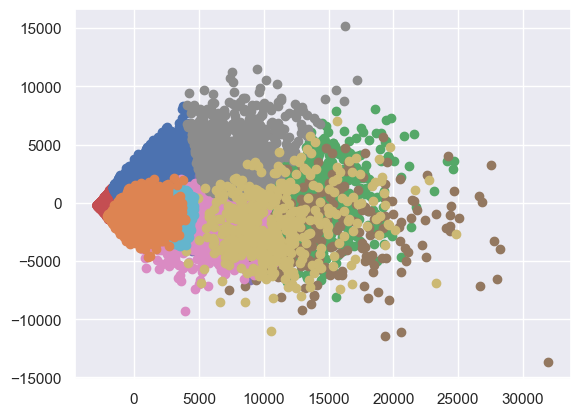

In [12]:
uniq = np.unique(pred)
for i in uniq:
   plt.scatter(components[pred == i , 0] , components[pred == i , 1] , label = i)